In [1]:
# Imports
import calendar
import datetime as dt
import math
import pickle
import time
from ast import literal_eval
from datetime import date, timedelta
from json import dumps
from math import pi
from multiprocessing import Pool, cpu_count, current_process
from os import makedirs
from os.path import exists, join
from pathlib import Path
from random import randrange

import folium
import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import seaborn as sns
from bokeh.embed import json_item
from bokeh.io import output_file, output_notebook, show
from bokeh.models import (
    ColumnDataSource,
    FactorRange,
    GMapOptions,
    HoverTool,
    Legend,
    LegendItem,
    Panel,
    Tabs,
)
from bokeh.palettes import viridis
from bokeh.plotting import figure, gmap, output_notebook, show
from bokeh.tile_providers import Vendors, get_provider
from bokeh.transform import factor_cmap
from folium.plugins import HeatMap, HeatMapWithTime
from geopy import distance
from matplotlib.pyplot import rcParams
from pandas import (
    DatetimeIndex,
    Index,
    concat,
    get_dummies,
    isna,
    read_csv,
    to_datetime,
    unique,
)
from scipy import stats
from sklearn import metrics, preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, train_test_split

%matplotlib inline
rcParams.update({"font.size": 15})
sns.set(style="whitegrid")
output_notebook()

try:
    from google.colab import drive

    drive.mount("/content/drive")
except:
    pass

Loading BokehJS ...

In [2]:
# Read data

# Try to locate the folder with the data
possible_data_paths = [
    f"./Data",
    f"./Final Assignment/Data",
    f"drive/My Drive/Final Assignment/Data",
    f"C/Users/Mahsa/Social-Coding/Final project/Data",
    f"drive/My Drive/Notes/Dtu courses/4th_semester/Social Data Analysis and Visualization/assignments/Final Assignment/Data",
]

data_path = None
for possible_path in possible_data_paths:
    if exists(possible_path):
        data_path = possible_path
        models_path = join(possible_path, "..", "Stored Models")
        Path(models_path).mkdir(parents=True, exist_ok=True)
        folium_store = join(possible_path, "..", "Folium_maps")
        Path(folium_store).mkdir(parents=True, exist_ok=True)
        break

if not data_path:
    print("Failed to find the data folder")
    raise


def read_csv_from_disk(name):
    return read_csv(join(possible_path, name))


traffic_crashes_people = read_csv_from_disk("Traffic_Crashes_-_People.csv")
traffic_crashes_crashes = read_csv_from_disk("Traffic_Crashes_-_Crashes.csv")
red_light_violations = read_csv_from_disk("Red_Light_Camera_Violations.csv")
speed_camera_violations = read_csv_from_disk("Speed_Camera_Violations.csv")
public_schools = read_csv_from_disk(
    "Chicago_Public_Schools_-_Progress_Report_Cards__2011-2012_.csv"
)

path_for_merged_dataset = join(data_path, "merged_dataset.pickle")
if exists(path_for_merged_dataset):
    print("Reading merged dataset from file")
    data = pickle.load(open(path_for_merged_dataset, "rb"))

else:
    chicago_data = traffic_crashes_people[traffic_crashes_people["CITY"] == "CHICAGO"]
    data = chicago_data.merge(
        traffic_crashes_crashes, on="CRASH_RECORD_ID", how="outer"
    )
    data["CRASH_DATE"] = data.apply(
        lambda x: to_datetime(
            x["CRASH_DATE_x"] if isna(x["CRASH_DATE_y"]) else x["CRASH_DATE_y"]
        ),
        axis=1,
    )
    data = data.drop(["CRASH_DATE_x", "CRASH_DATE_y"], axis=1)
    data.to_csv(join(data_path, f"{name_for_merged_dataset}.csv"))
    pickle.dump(data, open(path_for_merged_dataset, "wb"))

/Users/alexandrosdorodoulis/Library/Python/3.7/lib/python/site-packages/IPython/core/interactiveshell.py:3254: DtypeWarning: Columns (12,13,20,21,22,23,24,25,26,27,29) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


Reading merged dataset from file


###### Motivation.
>* ###### What is your dataset?

The city of Chicago has publicised large amount of data on their city. For this project we dive into the datasets concerning crashes and accidents. We have collected the following datasets of their website:
* Chicago Public Schools - Progress Report Cards 2011-2012
* Traffic Crashes - Crashes
* Traffic Crashes - People

The Traffic Crashes datasets have been merged to help improve the ease of use. When the datasets Traffic Crashes - Crashes and Traffic Crashes - People have been merged a total of 575950 records are found with 399178 unique crashes.
>* ###### Why did you choose this/these particular dataset(s)?

It was chosen as we wanted datasets with large enough quantities and covering a larger timespan to allow for trends to appear and be identified. The datasets appared to have good quality variables and a large variaty of attributes. When we discovered a dataset over all elementrary, middel and high schools in the the Chigago area, we emidiately begged the question "Can we identify which schools have the highest number of car crashes surrounding them?". This was intented for new families moving to Chicargo to identify which ares and schools are the most safe for their kids to walk to and from alone. This is what we imagine whould be a high periority when moving to a new city with a young family.

>* ###### What was your goal for the end user's experience

Our goal is to inform the user about the accident profile around the schools in Chicago as well as trying to predict the accidents that are going to occur in the next 6 days. 

In [ ]:
print(len(data))
print(len(data.CRASH_RECORD_ID.unique()))

575950
399178


>###### Basic stats. Let's understand the dataset better
>* ###### Write about your choices in data cleaning and preprocessing

Firstly it was discorvered that the dataset contain person records with no age or negative ages, these were removed at we are very interested in discovering the age demographic of the person affected crashes. Furthermore it was found using a scatterplot that a few latitude and longitude values were set to zero which placed the accidents well outside the Chicago area and it was decided to remove these crashes from the dataset.

This reduced the datast to 417646 records with 265112 unique crashes.

New columns were added to change excisting information into a format which would allow for easier constructions of plots. Such as, month where January was identified as 1 (the month number) and we needed the month spelled out.

In [3]:
# Cleaning the data
data = data[
    np.logical_and(
        data["AGE"] >= 0,
        np.logical_and((data["LATITUDE"] > 10), (data["LONGITUDE"] < -10.0)),
    )
]  # remove all belive the age of 0 and # Removed  coordinational outliers (from 399178 to 266433 unique crashes)
# All crash ID's are 266433 unique accidents

# Create hour year and date columns
data["CRASH_DATE"] = pd.to_datetime(data["CRASH_DATE"])
data["DATE"] = data["CRASH_DATE"].apply(lambda x: x.date())
data["YEAR"] = data["CRASH_DATE"].apply(lambda x: x.year)
data["WEEKDAY"] = data["CRASH_DATE"].apply(lambda x: dt.datetime.strftime(x, "%A"))
data["MONTH"] = data["CRASH_MONTH"].apply(lambda x: calendar.month_abbr[x])

In [4]:
print(len(data))
print(len(data.CRASH_RECORD_ID.unique()))

417646
265112


In [5]:
print(list(data.columns))

['PERSON_ID', 'PERSON_TYPE', 'CRASH_RECORD_ID', 'RD_NO_x', 'VEHICLE_ID', 'SEAT_NO', 'CITY', 'STATE', 'ZIPCODE', 'SEX', 'AGE', 'DRIVERS_LICENSE_STATE', 'DRIVERS_LICENSE_CLASS', 'SAFETY_EQUIPMENT', 'AIRBAG_DEPLOYED', 'EJECTION', 'INJURY_CLASSIFICATION', 'HOSPITAL', 'EMS_AGENCY', 'EMS_RUN_NO', 'DRIVER_ACTION', 'DRIVER_VISION', 'PHYSICAL_CONDITION', 'PEDPEDAL_ACTION', 'PEDPEDAL_VISIBILITY', 'PEDPEDAL_LOCATION', 'BAC_RESULT', 'BAC_RESULT VALUE', 'CELL_PHONE_USE', 'RD_NO_y', 'CRASH_DATE_EST_I', 'POSTED_SPEED_LIMIT', 'TRAFFIC_CONTROL_DEVICE', 'DEVICE_CONDITION', 'WEATHER_CONDITION', 'LIGHTING_CONDITION', 'FIRST_CRASH_TYPE', 'TRAFFICWAY_TYPE', 'LANE_CNT', 'ALIGNMENT', 'ROADWAY_SURFACE_COND', 'ROAD_DEFECT', 'REPORT_TYPE', 'CRASH_TYPE', 'INTERSECTION_RELATED_I', 'NOT_RIGHT_OF_WAY_I', 'HIT_AND_RUN_I', 'DAMAGE', 'DATE_POLICE_NOTIFIED', 'PRIM_CONTRIBUTORY_CAUSE', 'SEC_CONTRIBUTORY_CAUSE', 'STREET_NO', 'STREET_DIRECTION', 'STREET_NAME', 'BEAT_OF_OCCURRENCE', 'PHOTOS_TAKEN_I', 'STATEMENTS_TAKEN_I', '

In [6]:
data.head()

,PERSON_ID,PERSON_TYPE,CRASH_RECORD_ID,RD_NO_x,VEHICLE_ID,SEAT_NO,CITY,STATE,ZIPCODE,SEX,...,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,CRASH_DATE,DATE,YEAR,WEEKDAY,MONTH
1,O1000,DRIVER,f2b1adeb85a15112e4fb7db74bff440d6ca53ff7a21e10...,HY407431,954.0,NaN,CHICAGO,IL,NaN,M,...,4,9,41.904034,-87.629923,POINT (-87.629922816094 41.904033653296),2015-09-02 11:45:00,2015-09-02,2015,Wednesday,Sep
2,O1001,DRIVER,f2b1adeb85a15112e4fb7db74bff440d6ca53ff7a21e10...,HY407431,955.0,NaN,CHICAGO,IL,60609,M,...,4,9,41.904034,-87.629923,POINT (-87.629922816094 41.904033653296),2015-09-02 11:45:00,2015-09-02,2015,Wednesday,Sep
3,O100002,DRIVER,2fcefeab458932d8b1b12e103c18c50adc659943cccd4b...,HZ525619,96754.0,NaN,CHICAGO,IL,60619,F,...,3,11,41.743505,-87.636663,POINT (-87.636662798126 41.743504557606),2016-11-15 17:45:00,2016-11-15,2016,Tuesday,Nov
4,O100004,DRIVER,c2f21fd14725cf30d43ae59057e59b2e225c9e62a846e7...,HZ525629,96755.0,NaN,CHICAGO,IL,60646,M,...,3,11,41.987151,-87.728400,POINT (-87.728399898659 41.98715096607),2016-11-22 13:45:00,2016-11-22,2016,Tuesday,Nov
5,O100006,DRIVER,5bfddf5ec81892bf71c2ba0f807c1ec112fd7ecdecbf3c...,HZ525606,96760.0,NaN,CHICAGO,IL,60625,M,...,7,11,41.985272,-87.652878,POINT (-87.652877679138 41.985272298459),2016-11-19 18:35:00,2016-11-19,2016,Saturday,Nov


>* ###### Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.

The dataset provides information when and where crashes occur, specified by, hour, month, day, road number, coordinates, etc. The conditions of the road, seed and road type were also specified, with as much detail as weather conditions during the accidents. Further detail was provided regarding the accident, specifying number of victims, their injuries and if they went to the hospital. Needless to say the amount of information was endless and required us to stay on topic even with loads of other great discoveries to be made.

Below the map indicates the distribution of accidents involving members of the public below the age of 10. This is due to reduce the dataset while still showing the dictribution. It can be seen that the accidents lie along the roads as expected. The Dataset is restricted to accidents with persons involved under the age of 10, as all accidents are too many to render and would merely give a much more crowded map. It will late be shows that the trends within the reduced agegroup are indicative of the overall dataset.

In [7]:
def save_map(mappe, title, data=""):
    mappe.save(join(folium_store, f"{title}.html"))
    if len(data) > 0:
        with open(join(folium_store, f"{title}.json"), "w") as f:
            f.write(dumps(data))
    return mappe


data10 = data[data["AGE"] < 10].copy()  # under the age of 10

mappe = folium.Map([41.8781, -87.6298], zoom_start=11)
points = []
for i in range(len(data10.LATITUDE)):
    location = [data10["LATITUDE"].iloc[i], data10["LONGITUDE"].iloc[i]]
    folium.Circle(radius=50, location=location, color="black", fill=True,).add_to(mappe)
    points.append(location)

save_map(mappe, "age_under_10", points)

The KDE plots the shows how many accidents happen spaced over the duration of 24 hours. We see three notable spikes. Fistly 7-9 o'clock which is when a large majority of the working populations will set of to leave their kids at school and/or drive to work. The next spike of the day is 17-19 o'clock which in turn is when people return from work. Lastly we have the time at 12 o'clock at night, which would clearly indicate the partying population starting to move around.

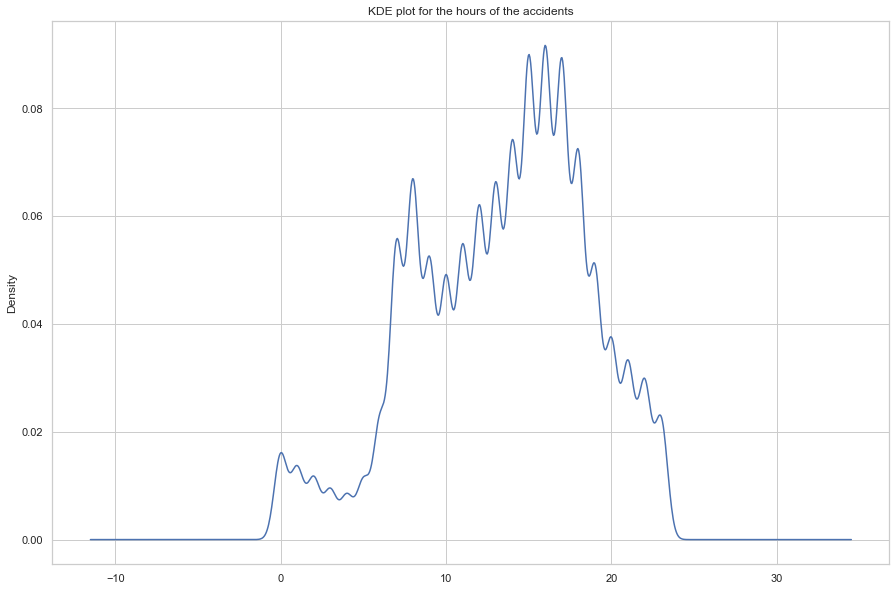

In [8]:
def create_plot(
    col,
    title,
    xlabel=None,
    bins=0,
    dataset=data,
    rot=0,
    figsize=(15, 10),
    plot="bar",
    **kwargs,
):
    if xlabel:
        plt.xlabel(xlabel)
    plt.title(title)

    if plot != "bar":
        dataset[col].plot.kde(rot=rot, figsize=figsize, **kwargs)
    else:
        grouped_dataset = dataset.groupby(col)
        if bins == 0:
            tmp = len(grouped_dataset)
            bins = tmp * 2 if tmp <= 20 else tmp
        grouped_dataset[col].count().plot.bar(rot=rot, figsize=figsize, **kwargs)

    path_to_store = join(possible_path, "..", "Plt_Plots")
    Path(path_to_store).mkdir(parents=True, exist_ok=True)
    plt.savefig(join(path_to_store, f"{title}.svg"), transparent=True)
    plt.show()


create_plot("CRASH_HOUR", "KDE plot for the hours of the accidents", plot="kde")

Below the the accidents are distributed over the week, its emideiately clear that Sunday (1) has the least accidents which is to be assumed considering it is the common day off resulting in less cars on the road. Oppositely Friday (6) is the most accident prone day, likely due to people being tired from a long week.

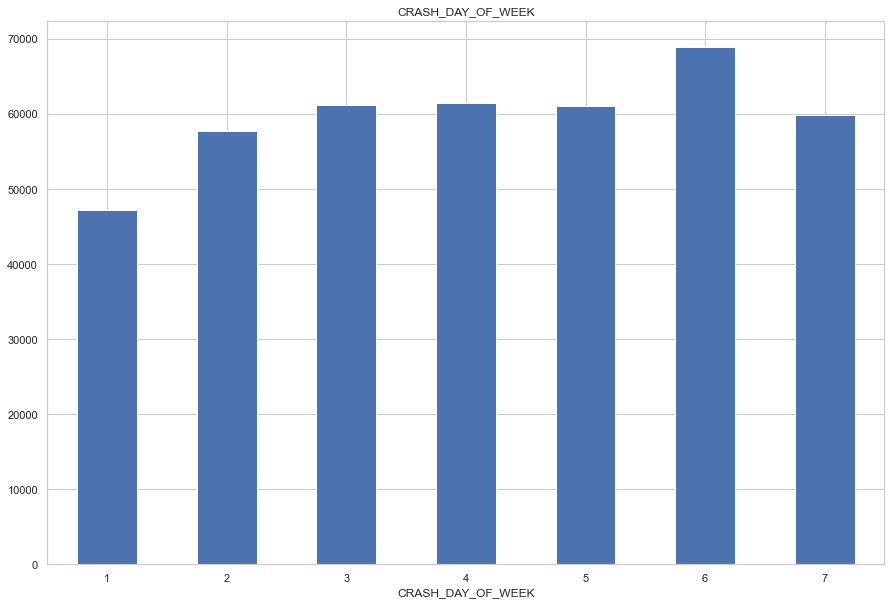

In [9]:
create_plot("CRASH_DAY_OF_WEEK", "CRASH_DAY_OF_WEEK")

Looking more into the crash statistics, we find that the majority of accidents happen on roads with a 30mph speed limit. This is the default speed limit for roads in Chicago, and it's therefore safe to assume that most roads have this limit imposed.

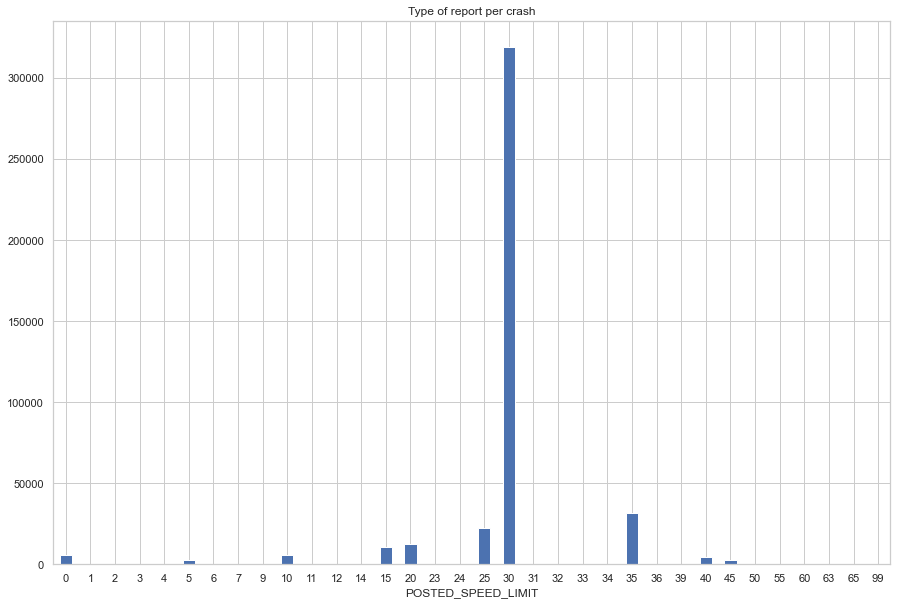

In [10]:
create_plot("POSTED_SPEED_LIMIT", "Type of report per crash")

The distributions between there being any injuries are fairly similar, though it is roughtly twise as likely for an accident to not cause any injuries.

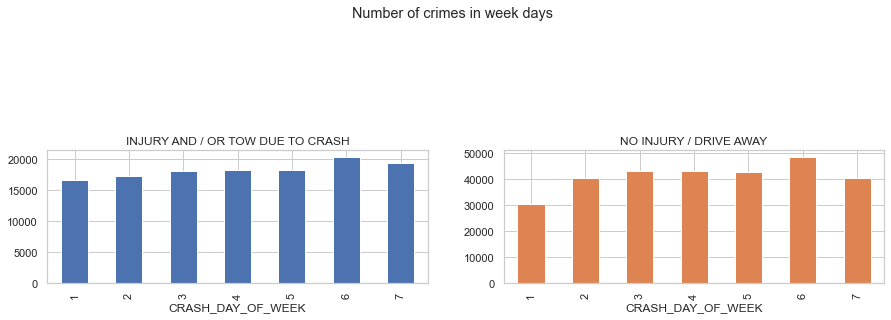

In [11]:
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
dayss = [1, 2, 3, 4, 5, 6, 7]

focuscrimrs_count = data.groupby(["CRASH_DAY_OF_WEEK", "CRASH_TYPE"])[
    "CRASH_RECORD_ID"
].count()
focuscrimrs_count.unstack().reindex(dayss).plot.bar(
    subplots=True,
    layout=(7, 2),
    figsize=(15, 20),
    legend=False,
    title="Number of crimes in week days",
)
plt.show()

In the plot below we found that it most often is the driver that gets injured in an accident.

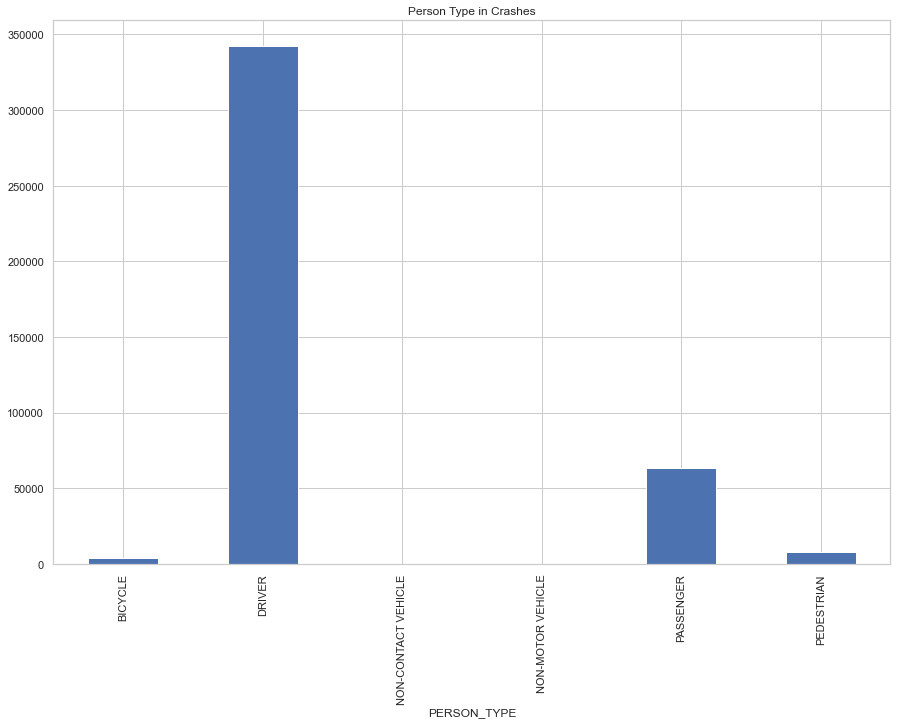

In [12]:
create_plot("PERSON_TYPE", "Person Type in Crashes", rot=90)

We now look into the school, looking at elemetrary (ES), Middle (MS) and high (HS) schools. Focusing on pedestrian accidents concerding children within the age range of each schooling level we hope to find some trends.

In [13]:
ES = public_schools[public_schools["Elementary, Middle, or High School"] == "ES"]
MS = public_schools[public_schools["Elementary, Middle, or High School"] == "MS"]
HS = public_schools[public_schools["Elementary, Middle, or High School"] == "HS"]

The map below indicated the areas with most accidents. It is found that there are clearly areas more at risk than others. This is the age group we are most interested in, and the map shows that the accidents are centreds around the schools, with highest dentities where there are also the highest densities of schools. The red circles highlight the areas where there are elementrary schools but very low if any densities of accidents. These are the areas which would according to this data be the safest for the kids to independently go to school in.

In [14]:
dataES = data[
    np.logical_and(
        np.logical_and(data["AGE"] > 4, data["AGE"] <= 10),
        data["PERSON_TYPE"] == "PEDESTRIAN",
    )
]

In [15]:
ES = ES.reset_index()
mappe = folium.Map([41.87, -87.6298], zoom_start=11)
for i in range(len(ES.Latitude)):
    folium.Circle(
        radius=50,
        location=[ES["Latitude"][i], ES["Longitude"][i]],
        color="black",
        fill=True,
    ).add_to(mappe)
heat_data = dataES[["LATITUDE", "LONGITUDE"]]
# Plot it on the map
HeatMap(heat_data, radius=13, max_zoom=13).add_to(mappe)

circles = [
    {"coor": [41.835, -87.63], "radius": 40},
    {"coor": [41.78, -87.78], "radius": 50},
    {"coor": [41.975, -87.80], "radius": 80},
    {"coor": [41.69, -87.63], "radius": 80},
]
for circle in circles:
    folium.CircleMarker(circle["coor"], radius=circle["radius"], color="red").add_to(
        mappe
    )
save_map(
    mappe, "es_with_circles", {"heat_data": heat_data.to_json(), "circles": circles}
)

In [16]:
dataES = data[
    np.logical_and(
        np.logical_and(data["AGE"] <= 13, data["AGE"] > 10),
        data["PERSON_TYPE"] == "PEDESTRIAN",
    )
]

When studying the same map but for middle school, we dont find any clear correlation. The hot spots dont seem to be near any schools, but were found to be near a Rock of Our Salvation Church and the ES Catalyst Circle Roc, and around Garfield Park. It was not possible to locate any facilities of interest that might be attracting the children in the high density areas.

In [17]:
mappe = folium.Map([41.87, -87.6298], zoom_start=11)
locations = []
for i in range(len(MS.Latitude)):
    location = [MS["Latitude"].iloc[i], MS["Longitude"].iloc[i]]
    folium.Circle(radius=50, location=location, color="black", fill=True,).add_to(mappe)
    locations.append(location)
heat_data = dataES[["LATITUDE", "LONGITUDE"]]
# Plot it on the map
HeatMap(heat_data, radius=14, max_zoom=13).add_to(mappe)
save_map(
    mappe,
    "es_with_ms_schools",
    {"heat_data": heat_data.to_json(), "locations": locations},
)

In [18]:
dataHS = data[
    np.logical_and(
        np.logical_and(data["AGE"] > 13, data["AGE"] <= 18),
        data["PERSON_TYPE"] == "PEDESTRIAN",
    )
]

We  find a bit of correlation when looking into the HS area, but no overall trend. A high density is identifies to the right of Marquette Park, where we found a high school which was not registered in the towns file. This happened again south of Oakwoods cemetery. This is a concerning trend which makes it hard to trust the data provided for this type of trend identification.

In [19]:
mappe = folium.Map([41.87, -87.6298], zoom_start=11)
for i in range(len(HS.Latitude)):
    folium.Circle(
        radius=50,
        location=[HS["Latitude"].iloc[i], HS["Longitude"].iloc[i]],
        color="black",
        fill=True,
    ).add_to(mappe)
heat_data = dataHS[["LATITUDE", "LONGITUDE"]]
# Plot it on the map
HeatMap(heat_data, radius=13, max_zoom=13).add_to(mappe)
save_map(mappe, "heatmap_hs")

In [20]:
dataES["dis"] = -13
for i in range(len(dataES.LATITUDE)):
    short_dis = 100000
    for j in range(len(ES.Latitude)):
        diss = math.sqrt(
            ((ES["Longitude"].iloc[j] - dataES["LONGITUDE"].iloc[i]) ** 2)
            + ((ES["Latitude"].iloc[j] - dataES["LATITUDE"].iloc[i]) ** 2)
        )
        if diss < short_dis:
            short_dis = diss
    dataES["dis"].iloc[i] = short_dis

/Users/alexandrosdorodoulis/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/Users/alexandrosdorodoulis/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the document

In [21]:
dataES.head()

,PERSON_ID,PERSON_TYPE,CRASH_RECORD_ID,RD_NO_x,VEHICLE_ID,SEAT_NO,CITY,STATE,ZIPCODE,SEX,...,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,CRASH_DATE,DATE,YEAR,WEEKDAY,MONTH,dis
9286,O116343,PEDESTRIAN,f5877a05e92520907cdb6985d2d76f40c2f7a07a2c905b...,JA112262,NaN,NaN,CHICAGO,IL,NaN,F,...,1,41.778329,-87.615726,POINT (-87.615725792181 41.778329098667),2017-01-11 17:44:00,2017-01-11,2017,Wednesday,Jan,0.002063
11876,O120789,PEDESTRIAN,1807c25b0edc868867e1e147280df6a58277f7401e1e79...,JA129926,NaN,NaN,CHICAGO,IL,NaN,F,...,1,41.850122,-87.695547,POINT (-87.69554656731 41.850122325002),2017-01-25 08:45:00,2017-01-25,2017,Wednesday,Jan,0.002403
16914,O129416,PEDESTRIAN,05b5e13dab578c62968bc2934d8fe5df406b8b0e769ba2...,JA165066,NaN,NaN,CHICAGO,IL,60629,M,...,2,41.811703,-87.701795,POINT (-87.701794717316 41.811702978771),2017-02-23 15:30:00,2017-02-23,2017,Thursday,Feb,0.002524
17061,O129671,PEDESTRIAN,24a842d8bf21a22a3200b4bbdb1775bcadabc13528323f...,JA165946,NaN,NaN,CHICAGO,IL,60620,M,...,2,41.743166,-87.664408,POINT (-87.664407767553 41.743166225608),2017-02-24 16:20:00,2017-02-24,2017,Friday,Feb,0.005052
21787,O137924,PEDESTRIAN,4a7026c489884ee9d9779c2a9a4e7121576877fceaf745...,JA193969,NaN,NaN,CHICAGO,IL,60644,F,...,3,41.891423,-87.745828,POINT (-87.745827674668 41.891423156311),2017-03-20 15:41:00,2017-03-20,2017,Monday,Mar,0.001554


The distance from each accident to the nearest elementrary school was calculated and the plot below shows the kde distribution of the findings. It was found that a large majority happen close to the schools, supporting what we have found.

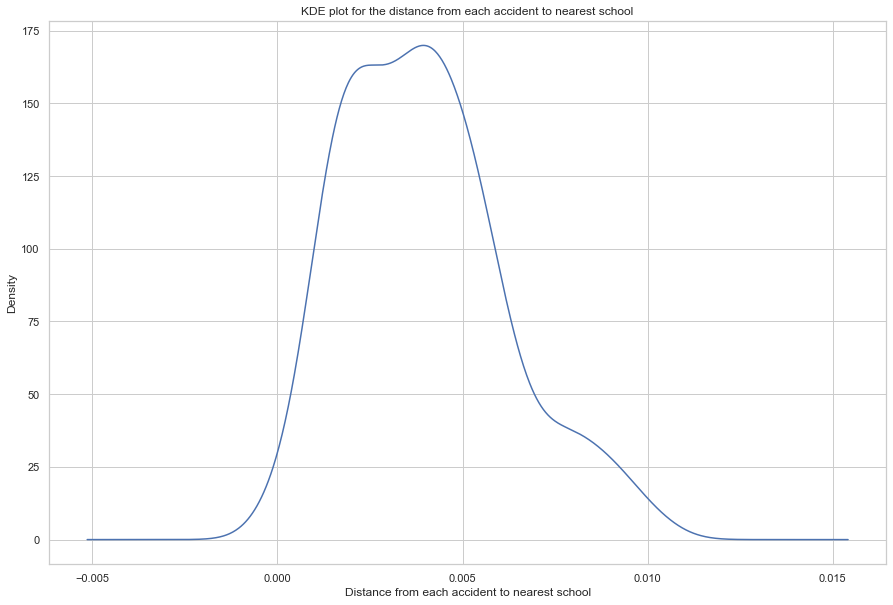

In [22]:
create_plot(
    "dis",
    "KDE plot for the distance from each accident to nearest school",
    xlabel="Distance from each accident to nearest school",
    dataset=dataES,
    plot="kde",
)

In [23]:
data["age_bins"] = pd.cut(
    x=data["AGE"], bins=[-1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]
)
data["age_bins"] = data["age_bins"].astype(str)
data["age_bins"] = data["age_bins"].transform(
    lambda x: x.replace("(", "")
    .replace("]", "")
    .replace(", ", " - ")
    .replace(".0", "")
    .replace("-1", "0")
)

In [24]:
def save_plot(p, name=None):
    file_name = name if name else p.title.text
    show(p)
    bokeh_path = join(possible_path, "..", "Bokeh_Plots")
    Path(bokeh_path).mkdir(parents=True, exist_ok=True)
    with open(join(bokeh_path, f"{file_name}.json"), "w") as f:
        f.write(dumps(json_item(p)))

The more interactive graph was made to show how accidents change within certain age groups. Especially when looking at 100< and <20 it was interesting to find that they seem to peak at different time intervals, clearly illustrating the differnece in daily rythm of the two age groups.

In [25]:
age = list(data.AGE.unique())
focuse_age = list(map(str, age))
hour_cat = data.groupby(["CRASH_HOUR", "age_bins"], as_index=False)[
    "CRASH_TYPE"
].count()
k = Index(unique(hour_cat.age_bins).tolist())
hourCat = hour_cat.pivot(index="CRASH_HOUR", columns="age_bins")

hourCat.columns = hourCat.columns.get_level_values(0)
hourCat.columns = k
for i in k:
    hourCat[i] = hourCat[i] / hourCat[i].sum()

hours = [str(j + 1) for j in range(24)]
p = figure(
    x_range=hours,
    y_range=(0, 0.15),
    plot_height=450,
    title="Crash per Hour",
    toolbar_location=None,
    plot_width=1200,
)
p.xaxis.axis_label = "Hour of the Day"
p.yaxis.axis_label = "Age "

palette = [
    "#FF0000",
    "#FF88FF",
    "#FF9900",
    "#FFCC00",
    "#FFFF00",
    "#99FF00",
    "#00BB00",
    "#00BBBB",
    "#00FFFF",
    "#0099FF",
    "#0000FF",
    "#5500FF",
    "#AA33AA",
]

bar = {}
items = []
colour = viridis(len(k))
for indx, i in enumerate(k):
    bar[i] = p.vbar(
        x=hours,
        top=hourCat[i].tolist(),
        width=0.7,
        muted_alpha=0.05,
        muted=True,
        fill_color=colour[indx],
        muted_color=colour[indx],
    )
    items.append((i, [bar[i]]))

legend = Legend(items=items, location=(0, 30))
p.add_layout(legend, "left")

p.legend.click_policy = "mute"
save_plot(p)

In this tab firmat plots, which desighn for the website, try to show an overview of the crash type(Injury and non injury) during the hours,days,months, ages and year, with hover tools , that viewer can go trough it in se more details.

In [26]:
col2 = [
    "CRASH_TYPE",
    "CRASH_DATE",
    "WEATHER_CONDITION",
    "YEAR",
    "MONTH",
    "WEEKDAY",
    "CRASH_HOUR",
    "AGE",
    "age_bins",
    "LONGITUDE",
    "LATITUDE",
]
multiple_crash = data[col2]
multiple_crash = data[
    data["WEATHER_CONDITION"].isin(
        [
            "CLEAR",
            "UNKNOWN",
            "CLOUDY/OVERCAST",
            "RAIN",
            "SNOW",
            "FOG/SMOKE/HAZE",
            "OTHER",
            "SLEET/HAIL",
            "SEVERE CROSS WIND GATE",
            "FREEZING RAIN/DRIZZLE",
            "BLOWING SNOW",
            "BLOWING SAND, SOIL, DIRT",
        ]
    )
]

# tab1
hour = [
    "0",
    "1",
    "2",
    "3",
    "4",
    "5",
    "6",
    "7",
    "8",
    "9",
    "10",
    "11",
    "12",
    "13",
    "14",
    "15",
    "16",
    "17",
    "18",
    "19",
    "20",
    "21",
    "22",
    "23",
]

crashtype = ["INJURY AND / OR TOW DUE TO CRASH", "NO INJURY / DRIVE AWAY"]

hour_crash = multiple_crash.groupby(by=["CRASH_TYPE", "CRASH_HOUR"])[
    "CRASH_HOUR"
].count()


plot_data = {
    "hour": hour,
    "INJURY AND / OR TOW DUE TO CRASH": hour_crash.unstack().values[0],
    "NO INJURY / DRIVE AWAY": hour_crash.unstack().values[1],
}


x = [(i, j) for i in hour for j in crashtype]
counts = sum(
    zip(
        plot_data["INJURY AND / OR TOW DUE TO CRASH"],
        plot_data["NO INJURY / DRIVE AWAY"],
    ),
    (),
)  # like an hstack

source = ColumnDataSource(data=dict(x=x, counts=counts))

p1 = figure(
    x_range=FactorRange(*x),
    plot_height=500,
    plot_width=1000,
    title="Crash type per Hours",
)

p1.vbar(
    x="x",
    top="counts",
    width=2,
    source=source,
    line_color="white",
    fill_color=factor_cmap(
        "x", palette=["red", "blue"], factors=crashtype, start=1, end=2
    ),
)
hover = HoverTool()
hover.tooltips = [("Cash Amounts  ", "@counts "), ("Hour / Crash type ", " @x")]


p1.add_tools(hover)
p1.xaxis.major_label_orientation = pi / 2
p1.xaxis.axis_label = "Hours"
p1.yaxis.axis_label = "Number of Crashes"


tab1 = Panel(child=p1, title="Crash type Per Hours")


# tab2--------------------------------------------------------------------------------------------
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
week_crash = multiple_crash.groupby(by=["CRASH_TYPE", "WEEKDAY"])["WEEKDAY"].count()

plot_data = {
    "day": days,
    "INJURY AND / OR TOW DUE TO CRASH": week_crash.unstack().values[0],
    "NO INJURY / DRIVE AWAY": week_crash.unstack().values[1],
}


x = [(i, j) for i in days for j in crashtype]
counts = sum(
    zip(
        plot_data["INJURY AND / OR TOW DUE TO CRASH"],
        plot_data["NO INJURY / DRIVE AWAY"],
    ),
    (),
)  # like an hstack

source = ColumnDataSource(data=dict(x=x, counts=counts))

p2 = figure(
    x_range=FactorRange(*x),
    plot_height=500,
    plot_width=1000,
    title="Crash type per day of week",
)

p2.vbar(
    x="x",
    top="counts",
    width=0.9,
    source=source,
    line_color="white",
    fill_color=factor_cmap(
        "x", palette=["red", "blue"], factors=crashtype, start=1, end=2
    ),
)
hover = HoverTool()
hover.tooltips = [("Crash Amounts  ", "@counts "), ("Day Of Week / Crash type ", " @x")]


p2.add_tools(hover)
p2.xaxis.major_label_orientation = pi / 2
p2.xaxis.axis_label = "Week Days"
p2.yaxis.axis_label = "Number of Crashes"

tab2 = Panel(child=p2, title="Crash type per day of week")


# tab3-----------------------------------------------------------------------------------------------
months = [
    "Jan",
    "Feb",
    "Mar",
    "Apr",
    "May",
    "Jun",
    "Jul",
    "Aug",
    "Sep",
    "Oct",
    "Nov",
    "Dec",
]
month_crash = multiple_crash.groupby(by=["CRASH_TYPE", "MONTH"])["MONTH"].count()

plot_data = {
    "day": days,
    "INJURY AND / OR TOW DUE TO CRASH": month_crash.unstack().values[0],
    "NO INJURY / DRIVE AWAY": month_crash.unstack().values[1],
}


x = [(i, j) for i in months for j in crashtype]
counts = sum(
    zip(
        plot_data["INJURY AND / OR TOW DUE TO CRASH"],
        plot_data["NO INJURY / DRIVE AWAY"],
    ),
    (),
)  # like an hstack

source = ColumnDataSource(data=dict(x=x, counts=counts))

p3 = figure(
    x_range=FactorRange(*x),
    plot_height=500,
    plot_width=1000,
    title="Crash type per month",
)

p3.vbar(
    x="x",
    top="counts",
    width=0.9,
    source=source,
    line_color="white",
    fill_color=factor_cmap(
        "x", palette=["red", "blue"], factors=crashtype, start=1, end=2
    ),
)
hover = HoverTool()
hover.tooltips = [("Cash Amounts  ", "@counts "), ("Month / Crash type ", " @x")]


p3.add_tools(hover)
p3.xaxis.major_label_orientation = pi / 2
p3.xaxis.axis_label = "Months"
p3.yaxis.axis_label = "Number of Crashes"

tab3 = Panel(child=p3, title="Crash type per month")


# tab4----------------------------------------------------------------------------------------------
ages = [
    "(0.0, 10.0]",
    "(10.0, 19.0]",
    "(19.0, 29.0]",
    "(29.0, 39.0]",
    "(39.0, 49.0]",
    "(49.0, 59.0]",
    "(59.0, 69.0]",
    "(69.0, 79.0]",
    "(79.0, 89.0]",
    "(89.0, 99.0]",
    "(99.0, 110.0]",
]
#'nan'
ages_crash = multiple_crash.groupby(by=["CRASH_TYPE", "age_bins"])["age_bins"].count()

plot_data = {
    "ages": ages,
    "INJURY AND / OR TOW DUE TO CRASH": ages_crash.unstack().values[0],
    "NO INJURY / DRIVE AWAY": ages_crash.unstack().values[1],
}


x = [(i, j) for i in ages for j in crashtype]
counts = sum(
    zip(
        plot_data["INJURY AND / OR TOW DUE TO CRASH"],
        plot_data["NO INJURY / DRIVE AWAY"],
    ),
    (),
)  # like an hstack

source = ColumnDataSource(data=dict(x=x, counts=counts))

p4 = figure(
    x_range=FactorRange(*x),
    plot_height=500,
    plot_width=1000,
    title="Crash type per ages",
)

p4.vbar(
    x="x",
    top="counts",
    width=0.9,
    source=source,
    line_color="white",
    fill_color=factor_cmap(
        "x", palette=["red", "blue"], factors=crashtype, start=1, end=2
    ),
)
hover = HoverTool()
hover.tooltips = [("Cash Amounts  ", "@counts "), ("Ages / Crash type ", " @x")]


p4.add_tools(hover)
p4.xaxis.major_label_orientation = pi / 2
p4.xaxis.axis_label = "Age Bins"
p4.yaxis.axis_label = "Number of Crashes"

tab4 = Panel(child=p4, title="Crash type per ages")


# tab5------------------------------------------------------------------------------------------------------
year_crash = multiple_crash.groupby(by=["CRASH_TYPE", "YEAR"])["YEAR"].count()
year_crash.unstack()

y1 = year_crash.unstack().values[0]
x = sorted(data["YEAR"].unique())
y2 = year_crash.unstack().values[1]
source1 = ColumnDataSource(data=dict(x=x, y=y1))
source2 = ColumnDataSource(data=dict(x=x, y=y2))


p5 = figure(plot_width=400, plot_height=400)
p5.line(
    "x",
    "y",
    source=source1,
    line_width=3,
    line_alpha=0.6,
    legend_label="INJURY ",
    line_color="green",
)

p5.line(
    "x",
    "y",
    source=source2,
    line_width=3,
    line_alpha=0.6,
    legend_label="NO INJURY ",
    line_color="red",
)

p5.legend.location = "top_left"
p5.legend.orientation = "horizontal"

hover = HoverTool()
hover.tooltips = [("Cash Amounts  ", "@y "), ("Year ", " @x")]


p5.add_tools(hover)
p5.xaxis.major_label_orientation = pi / 2
p5.xaxis.axis_label = "Year"
p5.yaxis.axis_label = "Number of Crashes"

tab5 = Panel(child=p5, title="Crash type per year")


tabs = Tabs(tabs=[tab1, tab2, tab3, tab4, tab5])

save_plot(tabs, "tab_view")

###### Data Analysis
>* ###### Describe your data analysis and explain what you've learned about the dataset.

We learned that not all schools were registered as we had priorly assumes, and that the overall daily routine of an age group can be identified from the number of accidents.

###### Genre. Which genre of data story did you use?

Annotated Graph - Map .

###### Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?_
<ul><li> Visual Narrative <ul><li>Visual Structuring:  we used -	Establishing Shot / Splash Screen used to show an overview of the locations of the crashes and the specific zones of interestand -	Progress Bar / Timebar: this tool used to show the past accident and predict the future. The time is mapped on the x-axis and the number of crashes to the y-axis  <li>Highlighting: In the case of highlighting strategies, refers to analyzing the use of such mechanisms as colors, size, character direction, motion, and  zooming  implemented  in  the  piece like maps, plots to direct the viewer’s attention to specific objects <li>Transition guidance: object continuity,In this case, by using the Familiar Objects- showing different views of crashes issues- shifting from the map to chart viewers seamlessly. </li></ul>



    

###### Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer)? Why?_


<ul><li> Narrativ Structure <ul><li>Ordering: User directed path which In this project, the user can start to read from anywhere, so it should be random access <li>Interactivity: Interactivity is ways that viewers can operate the visualization which describes how the user observes their placement within the story by filtering (in Bokeh plots), selecting, navigating (In maps), using text, dots. So, in this case, there is Very Limited Interactivity.  <li>Messaging: Most visualizations in this project are integrated and interconnected with the text, annotation of the chart, caption, or headlines within the text body.</li></ul> </li></ul>


Reference: Mario P.M, Felix K, Itia A.F.B, “Interaction in Digital News Media from Principles to Practice”, ISBN 978-3-319-96252-8 ISBN 978-3-319-96253-5.


###### Visualizations.
>* ###### Explain the visualizations you've chosen.
>* ###### Why are they right for the story you want to tell?

We have choosen a large majority of barplots and we are working with a lot of discrete variabels/categories which we bbeliev were best comepared this way. the maps are used to show how school locations and heatmaps of accidents overlap, giving the viewer a more understandable and easy to navigate understanding of the results.
Lastly the bokeh interactive plots are sued to allow the user to make discoveries on thewir own within the fixed narative we set.


###### Discussion. Think critically about your creation
>* ###### What went well?

We kept well on track with what our story was, which was hard as we easily got distracted by the possibility of or interesting trends which were not relevant. 
>* ###### What is still missing? What could be improved?, Why?

More studies could have been make in to the types of accidents and time of the day, even the year. Maybe by finding regions within Chicago, from where we chould have discussed which was safer to live in and why, further continuing our narative of catering to the family who wants to move there.

We might have been a bit too good at staying on target, not digging deeper into the dataset, this was a hard balance to find. 

## ML part

This part is going to train a Random Forest classifier with the purpose of predictin the amount of crashes that are going to happen in Chicago.

In order to tackle this problem, first the chicago is going to be splited into sub-regions. Each sub-regions is approximately a rectangle with dimension of (2km,1km). Afterwards the data have to be transformed in order to count the hourly accidents in each sub-regions. Finally some more data proccessing is required in order to extract usefull features and then the model can be trained.

In [36]:
# Cleanup data
machine_learning_df = traffic_crashes_crashes[
    traffic_crashes_crashes["LOCATION"] != "POINT (0 0)"
][
    [
        "CRASH_DATE",
        "WEATHER_CONDITION",
        "LATITUDE",
        "LONGITUDE",
        "CRASH_DAY_OF_WEEK",
        "CRASH_MONTH",
        "CRASH_HOUR",
    ]
]

# Number of rows and columns to generate (grid of 25x25)
num = 25
# Helper function to generate the cells of each grid
def generate_grid_cells(df):
    return np.sort(
        np.linspace(df.min() - df.min() * 0.001, df.max() + df.max() * 0.001, num)
    )


# Map each accident to a specific grid cell
lat = generate_grid_cells(machine_learning_df.LATITUDE)
long = generate_grid_cells(machine_learning_df.LONGITUDE)

machine_learning_df["GRID_ID"] = machine_learning_df.apply(
    lambda row: (
        np.searchsorted(lat, row.LATITUDE, side="right"),
        np.searchsorted(long, row.LONGITUDE, side="right"),
    ),
    axis=1,
)

# Print the grid info
display(
    "Grid density:",
    len(machine_learning_df["GRID_ID"].unique()) / (num ** 2),
    "Distance between lat:",
    distance.distance((lat[0], long[0]), (lat[1], long[0])).km,
    "Distance between long:",
    distance.distance((lat[0], long[0]), (lat[0], long[1])).km,
)


# A helper function in order to proccess the dataset in all availiable cpu cores
def parallelize_dataframe(df, func, n_cores=cpu_count()):
    v = np.array_split(df, n_cores)
    print("Start multi processing")
    with Pool(n_cores) as pool:
        df = pool.map(func, v)
    print("Finish multi proccessing")
    return pd.concat(df)


# Calculate the amount of accidents that happened each hour
def proccess_group(values):
    c = 1
    start = time.time()
    columns = list(final_ml_df.columns)
    columns.append("Y")
    df = pd.DataFrame(columns=columns)
    for i, value in values.iterrows():
        tmp = value.copy()
        tmp["Y"] = len(
            machine_learning_df[
                np.logical_and(
                    np.logical_and(
                        machine_learning_df["DATE"] == value["DATE"],
                        machine_learning_df["CRASH_HOUR"] == value["CRASH_HOUR"],
                    ),
                    machine_learning_df["GRID_ID"] == value["GRID_ID"],
                )
            ]
        )
        df = df.append(tmp)
        if c % 10000 == 0:
            end = time.time()
            print(
                f"{current_process()}: Proccessed {c} out of {len(values)} items and has been running for {(end-start)/60} minutes"
            )
        c += 1
    return df


# Try to load model from disk, if it isn't there, train it
path_for_ml_df = join(models_path, "ml_df.pickle")
if exists(path_for_ml_df):
    final_ml_df = pickle.load(open(path_for_ml_df, "rb"))
else:
    # One hot encode weather data
    machine_learning_df = machine_learning_df.join(
        get_dummies(machine_learning_df["WEATHER_CONDITION"], drop_first=True)
    ).drop(["UNKNOWN", "WEATHER_CONDITION"], axis=1)

    # Extract usefull info from the dataset
    machine_learning_df["CRASH_DATE"] = pd.to_datetime(
        machine_learning_df["CRASH_DATE"]
    )
    machine_learning_df["DATE"] = machine_learning_df["CRASH_DATE"].apply(
        lambda x: x.date()
    )
    machine_learning_df["YEAR"] = machine_learning_df["CRASH_DATE"].apply(
        lambda x: x.year
    )
    machine_learning_df = machine_learning_df[machine_learning_df["YEAR"] >= 2019]

    machine_learning_df.drop(
        ["LATITUDE", "LONGITUDE", "CRASH_DATE"], axis=1, inplace=True
    )

    final_ml_df = (
        machine_learning_df.groupby(["GRID_ID", "DATE", "CRASH_HOUR"])
        .nth(0)
        .reset_index()
    )
    final_ml_df = parallelize_dataframe(final_ml_df, proccess_group,)

    pickle.dump(final_ml_df, open(path_for_ml_df, "wb"))

'Grid density:'

0.5456

'Distance between lat:'

2.1369848744817577

'Distance between long:'

0.8126857639196009

#### The following cell calculates and adds to the data the days and hours that had no accidents

In [28]:
# Check if dataframe exists in disk, if not reacreate it
path_for_ml_padding = join(models_path, "ml_padding.pickle")
if exists(path_for_ml_padding):
    padding = pickle.load(open(path_for_ml_padding, "rb"))
else:

    def daterange(start_date, end_date):
        return [
            start_date + timedelta(n) for n in range(int((end_date - start_date).days))
        ]

    def hour_maps(date):
        start = time.time()
        columns = list(final_ml_df.columns)
        df = pd.DataFrame(columns=columns)
        for grid in final_ml_df.GRID_ID.unique():
            for hour in range(24):
                value = final_ml_df[
                    np.logical_and(
                        np.logical_and(
                            final_ml_df["DATE"] == date,
                            final_ml_df["CRASH_HOUR"] == hour,
                        ),
                        final_ml_df["GRID_ID"] == grid,
                    )
                ]
                # If there is already a crash in that time continue
                if not value.empty:
                    continue
                weather_values = [
                    "BLOWING SNOW",
                    "CLEAR",
                    "CLOUDY/OVERCAST",
                    "FOG/SMOKE/HAZE",
                    "FREEZING RAIN/DRIZZLE",
                    "OTHER",
                    "RAIN",
                    "SEVERE CROSS WIND GATE",
                    "SLEET/HAIL",
                    "SNOW",
                ]
                
                # Try to find the weather condition from the rest of the dataset
                search = final_ml_df[
                    np.logical_and(
                        final_ml_df["DATE"] == date, final_ml_df["CRASH_HOUR"] == hour,
                    )
                ]
                
                if search[weather_values].empty:
                    continue
                value = search[weather_values].iloc[0].copy()
                value["CRASH_DAY_OF_WEEK"] = date.weekday()
                value["CRASH_MONTH"] = date.month
                value["CRASH_HOUR"] = hour
                value["GRID_ID"] = grid
                value["DATE"] = date
                value["YEAR"] = date.year
                value["Y"] = 0

                df = df.append(value)

        print(f"Time elapsed for {date}: {time.time() - start}")
        return df

    start_date = final_ml_df["DATE"].min()
    end_date = final_ml_df["DATE"].max()

    with Pool(cpu_count()) as pool:
        padding = pd.concat(pool.map(hour_maps, daterange(start_date, end_date)))

    pickle.dump(padding, open(path_for_ml_padding, "wb"))

# Merge the two datasets
final_ml_df = pd.concat([final_ml_df, padding]).drop("DATE", axis=1)

In [29]:
# Label encode the grid_ids
le = preprocessing.LabelEncoder()
final_ml_df["GRID_ID"] = le.fit_transform(final_ml_df["GRID_ID"].apply(str))

# Split data into train and test
X = final_ml_df.copy()
y = X.pop("Y")
X_train, X_eval, y_train, y_eval = train_test_split(
    X, y, test_size=0.33, random_state=42
)
y_train = y_train.astype("int")
y_eval = y_eval.astype("int")

#### Model training

In [30]:
max_depth = [int(x) for x in np.linspace(10, 80, num=11)]
max_depth.append(None)
random_grid = {
    "n_estimators": [int(x) for x in np.linspace(start=100, stop=500, num=10)],
    "max_depth": max_depth,
    "min_samples_split": [2, 5, 10],
}

random_estimator_path = join(models_path, "random_forest.pkl")
# Try to load model from disk, if the model isn't found then train it
if exists(random_estimator_path):
    best_random = joblib.load(random_estimator_path)
    display({k: v for k, v in best_random.get_params().items() if k in random_grid})
else:
    # Find the best hyperparameters for the model using random search cv
    rf = RandomForestClassifier()
    rf_random = RandomizedSearchCV(
        estimator=rf,
        param_distributions=random_grid,
        n_iter=50,
        cv=3,
        verbose=2,
        random_state=0,
        n_jobs=-1,
    )  # Fit the random search model
    rf_random.fit(X_train, y_train)
    best_random = rf_random.best_estimator_
    joblib.dump(best_random, random_estimator_path, compress=0)
    display(rf_random.best_params_)

{'max_depth': 24, 'min_samples_split': 5, 'n_estimators': 455}

In [31]:
# Helper function to evaluate a model
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    accuracy = model.score(test_features, test_labels)
    print("Model Performance")
    print("Average Error: {:0.4f} degrees.".format(np.mean(errors)))
    print("Accuracy = {:0.4f}%.".format(accuracy))
    return accuracy


# Train a base model to compare it with the model generate from the hyperparameter optimization
base_model = RandomForestClassifier(n_estimators=10, random_state=0)
base_model.fit(X_train, y_train)

# Calculate the difference beteween the two models
base_accuracy = evaluate(base_model, X_eval, y_eval)
random_accuracy = evaluate(best_random, X_eval, y_eval)
print(
    "Improvement of {:0.2f}%.".format(
        100 * (random_accuracy - base_accuracy) / base_accuracy
    )
)

Model Performance
Average Error: 0.2218 degrees.
Accuracy = 0.7893%.
Model Performance
Average Error: 0.1984 degrees.
Accuracy = 0.8131%.
Improvement of 3.01%.


### Predicting accidents in the next six days
This part of the notebook is going to predict the amount of crashes that are going to happen, in each region, for the next 6 days after 2020-05-15. 

First the weather prediction, for the next 6 days, is going to be retrieved from the openweather api. Afterwords, the data for the model 

In [34]:
# Function to request data from Open weather API
def call_api(key="The API KEY for Open weather goes here", lat=41.836828, lon=-87.640686):
    api_url = f"https://api.openweathermap.org/data/2.5/onecall?lat={lat}&lon={lon}&exclude=current,minutely,hourly&appid={key}"
    response = requests.get(api_url)
    if response.status_code == 200:
        return json.loads(response.content.decode("utf-8"))
    print(
        "Failed to get proper response from openweather maps, please check you api key"
    )
    raise


res = call_api()
# Keep only usefull info from the response
weather_prediction = {i["dt"]: i["weather"][0]["main"] for i in res["daily"]}
# Transform open weather data to the variables in the dataset
weather_mapping = {"Rain": "RAIN", "Clouds": "CLOUDY/OVERCAST", "Clear": "CLEAR"}

# Prepare the data in order to ask the model for a prediction
weather_values = [
    "BLOWING SNOW",
    "CLEAR",
    "CLOUDY/OVERCAST",
    "FOG/SMOKE/HAZE",
    "FREEZING RAIN/DRIZZLE",
    "OTHER",
    "RAIN",
    "SEVERE CROSS WIND GATE",
    "SLEET/HAIL",
    "SNOW",
]
grids = final_ml_df.GRID_ID.unique()
columns = list(X.columns)
predictions = pd.DataFrame(columns=columns)
for key, weath in weather_prediction.items():
    date = dt.datetime.fromtimestamp(key)
    value = pd.DataFrame(columns=columns)
    value.at[0, weather_values] = 0
    value.at[0, weather_mapping.get(weath, "OTHER")] = 1
    value["CRASH_DAY_OF_WEEK"] = date.weekday()
    value.at[0, "CRASH_MONTH"] = date.month
    value.at[0, "YEAR"] = date.year
    for grid in grids:
        value.at[0, "GRID_ID"] = grid
        for hour in range(24):
            value.at[0, "CRASH_HOUR"] = hour
            predictions = predictions.append(value)

In [48]:
# Generate the prediction from the model
model_predictions = best_random.predict(predictions)

# Proccess the model prediction in order to present results
display_data = predictions.copy()
display_data["Y"] = model_predictions
display_data["GRID_ID"] = display_data["GRID_ID"].apply(
    lambda x: le.inverse_transform([x])[0]
)
tod = dt.datetime.today()
week_day = tod.weekday()
print("Predictions for the next 6 days:")
crashes = {}
for group, value in display_data.groupby("CRASH_DAY_OF_WEEK"):
    tmp = value.iloc[0]
    if tmp["CRASH_DAY_OF_WEEK"] == week_day:
        continue
    day = dt.datetime.today().day + (
        tmp["CRASH_DAY_OF_WEEK"] - week_day
        if week_day < tmp["CRASH_DAY_OF_WEEK"]
        else 7 + tmp["CRASH_DAY_OF_WEEK"] - week_day
    )
    date = f"{tmp['YEAR']}-{tmp['CRASH_MONTH']}-{day}"
    tmp = value[["CRASH_HOUR", "Y", "GRID_ID"]].iloc[np.where(value["Y"] > 0)]
    tmp =  pd.DataFrame(tmp.groupby("CRASH_HOUR")["Y"].count())
    tmp.columns = ["NumCrashes"]
    if tmp.empty:
        print(f"There aren't going to be any crashes at {date} \n")
    else:
        print(f"For date {date} there are going to be crashes at:")
        display(tmp)

Predictions for the next 6 days:
There aren't going to be any crashes at 2020-5-18 

For date 2020-5-19 there are going to be crashes at:


,NumCrashes
CRASH_HOUR,
0,32
1,25
2,1
7,2
9,1
10,7
11,13
12,7
13,33


For date 2020-5-20 there are going to be crashes at:


,NumCrashes
CRASH_HOUR,
6,3
8,1
9,2
10,1
14,1
16,6
17,1


For date 2020-5-21 there are going to be crashes at:


,NumCrashes
CRASH_HOUR,
8,3
14,7
15,12
16,8
17,2
18,2


For date 2020-5-16 there are going to be crashes at:


,NumCrashes
CRASH_HOUR,
11,20
12,1
13,11
15,12
18,29


For date 2020-5-17 there are going to be crashes at:


,NumCrashes
CRASH_HOUR,
6,1
11,40
12,82
13,220
14,51
15,113
16,94
17,163
18,4


### Results

Even though the model overestimates the accidents in some days (this could be improved by training the model for longer), overall it predicts numbers that look plausible.

## Contributions. Who did what?
>* You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That's what you should explain).
>* It is not OK simply to write "All group members contributed equally".

When considering which member did most within what part, the notebook could be split into 3 pieces, data cleaning and processing, bokeh plots, and machine leanring and web design. These were based on expected time for coding. Tanya worked on data cleanign and processing which entailed the barplots and folium maps, while Mahsa worked on the science of the bokeh plots ensuring they needed only a data sourse and could then generate all the interactive plots we needed. Lastly Alex headed the machine learning project and web design. Overall everyone touch on all parts of the project.